In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
import cv2
import numpy as np
from PIL import Image

tif_path = '/content/drive/MyDrive/Lab2/kartinka.tif'
output_dir = './dataset'
patch_size = 128


coords = {
    'Forest': [[6235, 4958, 3737, 1163], [15481, 120, 577, 2070], [15508, 1898, 628, 1381], [5904, 19, 916, 1985]],
    'Road': [[2647, 3820, 229, 768], [2079, 5765, 365, 135], [2036, 6433, 336, 180], [2036, 6855, 336, 198], [4386, 5632, 479, 223], [9191, 7241, 1110, 60], [14217, 6786, 842, 83], [2326, 6042, 79, 375]],
    'Field': [[12963, 720, 2155, 5028], [11219, 4479, 1909, 2368], [7320, 7942, 8220, 3089], [223, 2914, 1368, 2689], [2810, 8666, 2702, 2361]],
    'Grass': [[1588, 70, 3629, 2890], [13029, 81, 1854, 627], [4813, 2986, 1236, 1121], [2705, 4845, 1407, 975], [6118, 7936, 785, 408]],
    'House': [[2113, 4248, 403, 491], [3128, 4113, 561, 568], [1547, 6376, 424, 598], [4743, 4526, 408, 620]]
}

Image.MAX_IMAGE_PIXELS = None
img = Image.open(tif_path)
img_np = np.array(img)

for label, zones in coords.items():
    label_path = os.path.join(output_dir, label)
    os.makedirs(label_path, exist_ok=True)
    count = 0
    for x, y, w, h in zones:

        zone_img = img_np[y:y+h, x:x+w]

        for row in range(0, h - patch_size, patch_size // 2):
            for col in range(0, w - patch_size, patch_size // 2):
                patch = zone_img[row:row+patch_size, col:col+patch_size]
                if patch.shape[0] == patch_size and patch.shape[1] == patch_size:
                    cv2.imwrite(f"{label_path}/{count}.jpg", cv2.cvtColor(patch, cv2.COLOR_RGB2BGR))
                    count += 1
    print(f"Класс {label}: нарезано {count} патчей")

Класс Forest: нарезано 1767 патчей
Класс Road: нарезано 48 патчей
Класс Field: нарезано 11668 патчей
Класс Grass: нарезано 3259 патчей
Класс House: нарезано 159 патчей


Рисую схему разметки...


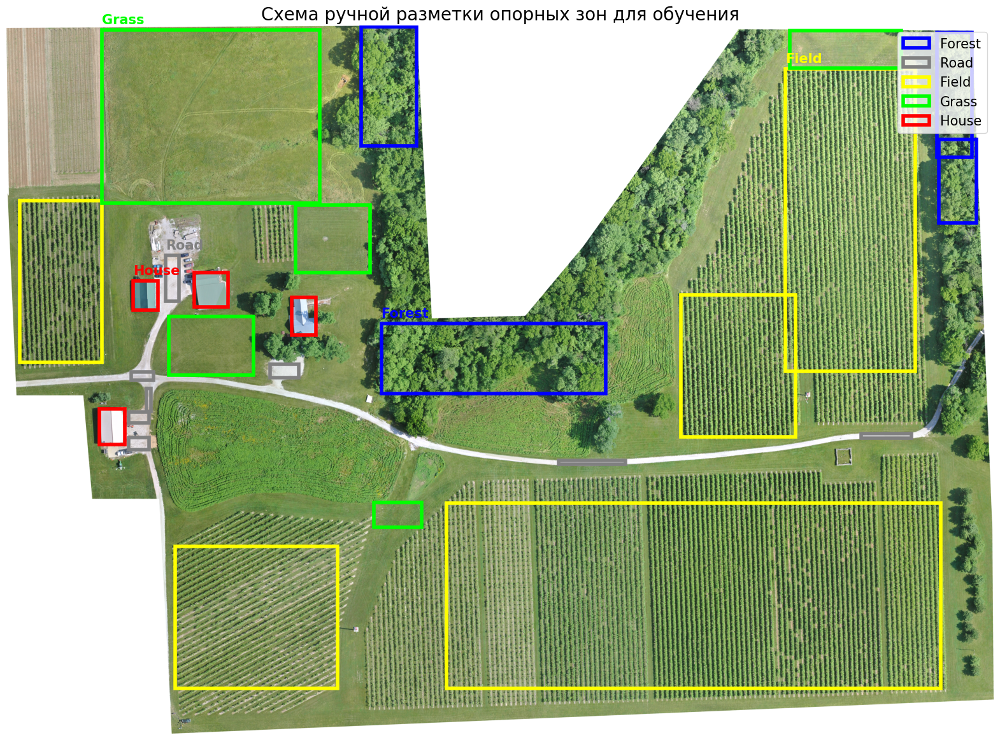

Готово! Файл 'manual_selection.png' сохранен.


In [14]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import numpy as np

coords = {
    'Forest': [[6235, 4958, 3737, 1163], [15481, 120, 577, 2070], [15508, 1898, 628, 1381], [5904, 19, 916, 1985]],
    'Road': [[2647, 3820, 229, 768], [2079, 5765, 365, 135], [2036, 6433, 336, 180], [2036, 6855, 336, 198], [4386, 5632, 479, 223], [9191, 7241, 1110, 60], [14217, 6786, 842, 83], [2326, 6042, 79, 375]],
    'Field': [[12963, 720, 2155, 5028], [11219, 4479, 1909, 2368], [7320, 7942, 8220, 3089], [223, 2914, 1368, 2689], [2810, 8666, 2702, 2361]],
    'Grass': [[1588, 70, 3629, 2890], [13029, 81, 1854, 627], [4813, 2986, 1236, 1121], [2705, 4845, 1407, 975], [6118, 7936, 785, 408]],
    'House': [[2113, 4248, 403, 491], [3128, 4113, 561, 568], [1547, 6376, 424, 598], [4743, 4526, 408, 620]]
}

class_colors = {
    'Forest': 'blue',
    'Road': 'gray',
    'Field': 'yellow',
    'Grass': 'lime',
    'House': 'red'
}



print("Рисую схему разметки...")
fig, ax = plt.subplots(figsize=(20, 15))

ax.imshow(img_np)


for label, zones in coords.items():
    for i, (x, y, w, h) in enumerate(zones):

        rect = patches.Rectangle(
            (x, y), w, h,
            linewidth=4,
            edgecolor=class_colors[label],
            facecolor='none',
            label=label if i == 0 else ""
        )
        ax.add_patch(rect)

        if i == 0:
            plt.text(x, y-100, label, color=class_colors[label], fontsize=15, fontweight='bold')


plt.legend(loc='upper right', fontsize=15)
plt.title("Схема ручной разметки опорных зон для обучения", fontsize=20)
plt.axis('off')


plt.savefig('manual_selection.png', dpi=150, bbox_inches='tight')
plt.show()

print("Готово! Файл 'manual_selection.png' сохранен.")

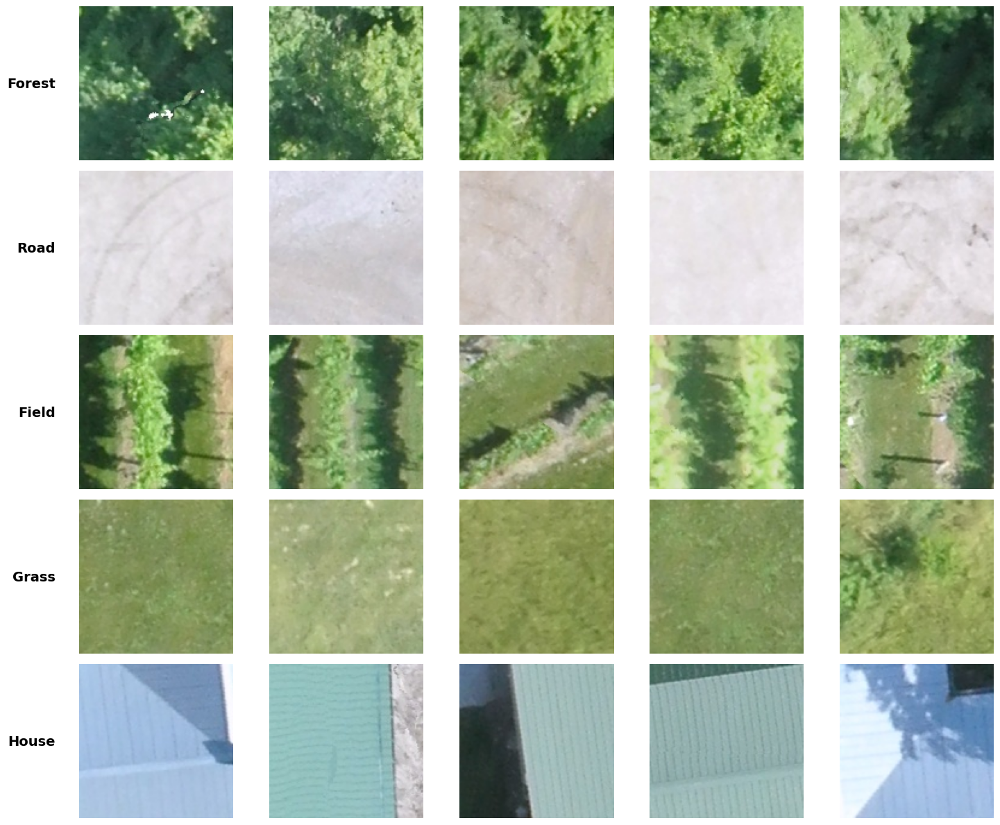

In [3]:
import matplotlib.pyplot as plt
import glob
import random
import os
from PIL import Image

classes = ['Forest', 'Road', 'Field', 'Grass', 'House']
n_examples = 5

fig, axes = plt.subplots(len(classes), n_examples, figsize=(15, 12))

for i, label in enumerate(classes):
    path = os.path.join('./dataset', label, "*.jpg")
    files = glob.glob(path)

    samples = random.sample(files, min(len(files), n_examples))

    for j in range(n_examples):
        ax = axes[i, j]
        if j < len(samples):
            img = Image.open(samples[j])
            ax.imshow(img)
        ax.axis('off')
        if j == 0:
            ax.text(-20, patch_size//2, label, fontsize=14, fontweight='bold', ha='right', va='center')

plt.tight_layout()
plt.savefig('report_examples.png', bbox_inches='tight', dpi=150)
plt.show()


#Делаем аугментацию для дорог, сокращаем количесво полей

In [4]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, models, transforms
from torch.utils.data import DataLoader, WeightedRandomSampler, Subset
import numpy as np


train_transforms = transforms.Compose([
    transforms.Resize(224),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(90),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])


full_dataset = datasets.ImageFolder(root='./dataset')


class_counts = [len(glob.glob(f'./dataset/{c}/*.jpg')) for c in full_dataset.classes]
print(f"Исходное распределение: {dict(zip(full_dataset.classes, class_counts))}")

# Создаем веса для каждой картинки (чем меньше картинок в классе, тем больше вес)
class_weights = 1. / torch.tensor(class_counts, dtype=torch.float)
sample_weights = [class_weights[label] for _, label in full_dataset.imgs]

# Самплер будет вытягивать редкие классы чаще
sampler = WeightedRandomSampler(weights=sample_weights, num_samples=3000, replacement=True)

# Ограничиваем общий объем данных до 3000 патчей, чтобы не учить вечность
dataset = datasets.ImageFolder(root='./dataset', transform=train_transforms)
train_loader = DataLoader(dataset, batch_size=32, sampler=sampler)

# ResNet18)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = models.resnet18(pretrained=True)
model.fc = nn.Linear(model.fc.in_features, 5) # 5 наших классов
model = model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.0005) # чуть меньший шаг для точности

# обучение
print("\nНачинаем обучение с балансировкой классов...")
model.train()
for epoch in range(10):
    running_loss = 0.0
    correct = 0
    total = 0

    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()

        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    print(f"Эпоха {epoch+1}/10 | Loss: {running_loss/len(train_loader):.4f} | Acc: {100*correct/total:.2f}%")

print("\nУспешно")

Исходное распределение: {'Field': 11668, 'Forest': 1767, 'Grass': 3259, 'House': 159, 'Road': 48}


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 167MB/s]



Начинаем обучение с балансировкой классов...
Эпоха 1/10 | Loss: 0.2317 | Acc: 92.27%
Эпоха 2/10 | Loss: 0.0849 | Acc: 97.17%
Эпоха 3/10 | Loss: 0.1026 | Acc: 96.73%
Эпоха 4/10 | Loss: 0.0714 | Acc: 97.80%
Эпоха 5/10 | Loss: 0.0900 | Acc: 97.17%
Эпоха 6/10 | Loss: 0.0419 | Acc: 98.33%
Эпоха 7/10 | Loss: 0.0575 | Acc: 98.30%
Эпоха 8/10 | Loss: 0.0604 | Acc: 98.07%
Эпоха 9/10 | Loss: 0.0622 | Acc: 97.63%
Эпоха 10/10 | Loss: 0.0621 | Acc: 97.83%

Успешно


In [6]:
from torchvision import transforms


data_transform = transforms.Compose([
    transforms.Resize(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

Начинаю сканирование изображения (92x128 блоков)...
Обработано строк: 0/92
Обработано строк: 10/92
Обработано строк: 20/92
Обработано строк: 30/92
Обработано строк: 40/92
Обработано строк: 50/92
Обработано строк: 60/92
Обработано строк: 70/92
Обработано строк: 80/92
Обработано строк: 90/92


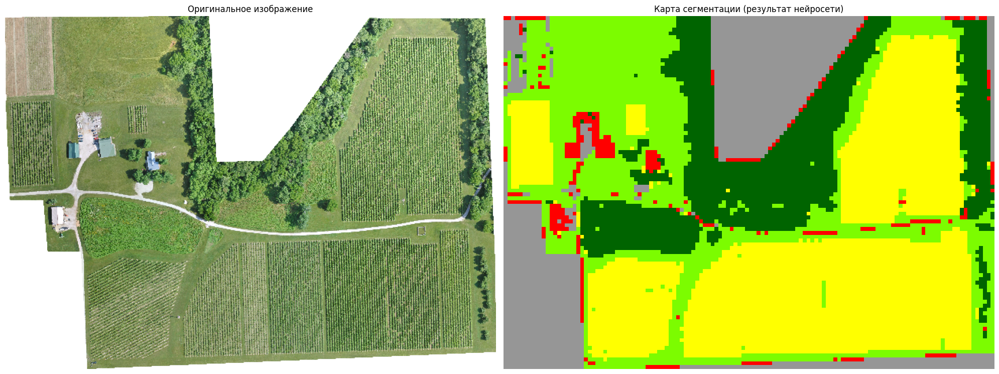

Карта сохранена как 'final_segmentation.png'.


In [7]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np


class_colors = [
    [255, 255, 0],
    [0, 100, 0],
    [124, 252, 0],
    [255, 0, 0],
    [150, 150, 150]
]


step = 128
patch_size = 128


h_orig, w_orig = img_np.shape[0], img_np.shape[1]
rows = h_orig // step
cols = w_orig // step
mask = np.zeros((rows, cols, 3), dtype=np.uint8)

print(f"Начинаю сканирование изображения ({rows}x{cols} блоков)...")

model.eval()
with torch.no_grad():
    for i in range(rows):
        if i % 10 == 0: print(f"Обработано строк: {i}/{rows}")
        for j in range(cols):

            y, x = i * step, j * step
            patch = img_np[y:y+patch_size, x:x+patch_size]


            if patch.shape[0] == patch_size and patch.shape[1] == patch_size:

                img_pil = Image.fromarray(patch)
                input_tensor = data_transform(img_pil).unsqueeze(0).to(device)

                output = model(input_tensor)
                _, predicted = torch.max(output, 1)


                mask[i, j] = class_colors[predicted.item()]


plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.imshow(cv2.resize(img_np, (cols*5, rows*5)))
plt.title("Оригинальное изображение")
plt.axis('off')


plt.subplot(1, 2, 2)
plt.imshow(mask)
plt.title("Карта сегментации (результат нейросети)")
plt.axis('off')

plt.tight_layout()
plt.savefig('final_segmentation.png', dpi=300)
plt.show()

print("Карта сохранена как 'final_segmentation.png'.")

Начинаю сканирование изображения (184x256 блоков)...
Обработано строк: 0/184
Обработано строк: 10/184
Обработано строк: 20/184
Обработано строк: 30/184
Обработано строк: 40/184
Обработано строк: 50/184
Обработано строк: 60/184
Обработано строк: 70/184
Обработано строк: 80/184
Обработано строк: 90/184
Обработано строк: 100/184
Обработано строк: 110/184
Обработано строк: 120/184
Обработано строк: 130/184
Обработано строк: 140/184
Обработано строк: 150/184
Обработано строк: 160/184
Обработано строк: 170/184
Обработано строк: 180/184


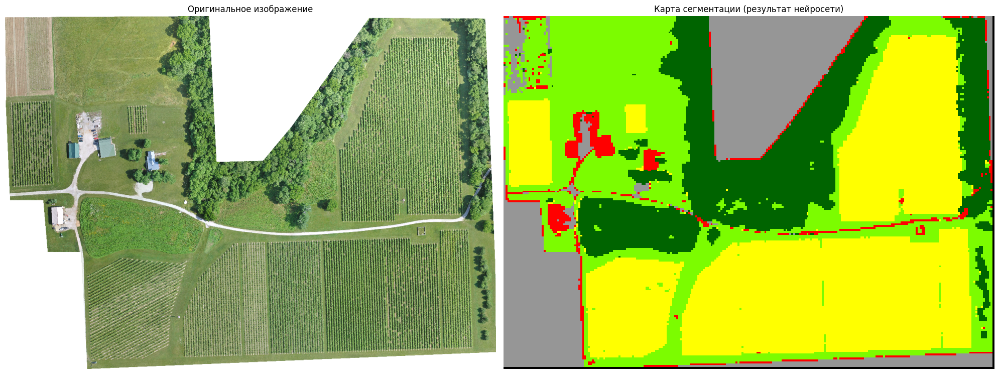

Карта сохранена как 'final_segmentation.png'.


In [8]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np


class_colors = [
    [255, 255, 0],
    [0, 100, 0],
    [124, 252, 0],
    [255, 0, 0],
    [150, 150, 150]
]


step = 64
patch_size = 128


h_orig, w_orig = img_np.shape[0], img_np.shape[1]
rows = h_orig // step
cols = w_orig // step
mask = np.zeros((rows, cols, 3), dtype=np.uint8)

print(f"Начинаю сканирование изображения ({rows}x{cols} блоков)...")

model.eval()
with torch.no_grad():
    for i in range(rows):
        if i % 10 == 0: print(f"Обработано строк: {i}/{rows}")
        for j in range(cols):

            y, x = i * step, j * step
            patch = img_np[y:y+patch_size, x:x+patch_size]


            if patch.shape[0] == patch_size and patch.shape[1] == patch_size:

                img_pil = Image.fromarray(patch)
                input_tensor = data_transform(img_pil).unsqueeze(0).to(device)

                output = model(input_tensor)
                _, predicted = torch.max(output, 1)


                mask[i, j] = class_colors[predicted.item()]


plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.imshow(cv2.resize(img_np, (cols*5, rows*5)))
plt.title("Оригинальное изображение")
plt.axis('off')


plt.subplot(1, 2, 2)
plt.imshow(mask)
plt.title("Карта сегментации (результат нейросети)")
plt.axis('off')

plt.tight_layout()
plt.savefig('final_segmentation.png', dpi=300)
plt.show()

print("Карта сохранена как 'final_segmentation.png'.")

Начинаю сканирование изображения (46x64 блоков)...
Обработано строк: 0/46
Обработано строк: 10/46
Обработано строк: 20/46
Обработано строк: 30/46
Обработано строк: 40/46


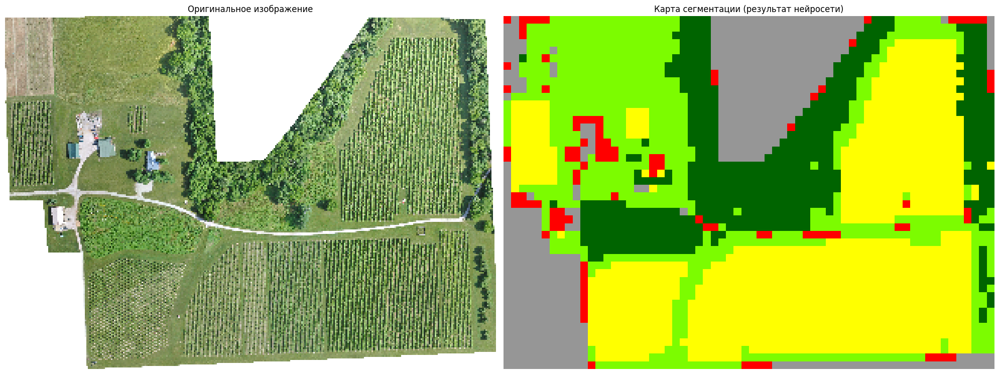

Карта сохранена


In [9]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np


class_colors = [
    [255, 255, 0],
    [0, 100, 0],
    [124, 252, 0],
    [255, 0, 0],
    [150, 150, 150]
]


step = 256
patch_size = 128


h_orig, w_orig = img_np.shape[0], img_np.shape[1]
rows = h_orig // step
cols = w_orig // step
mask = np.zeros((rows, cols, 3), dtype=np.uint8)

print(f"Начинаю сканирование изображения ({rows}x{cols} блоков)...")

model.eval()
with torch.no_grad():
    for i in range(rows):
        if i % 10 == 0: print(f"Обработано строк: {i}/{rows}")
        for j in range(cols):

            y, x = i * step, j * step
            patch = img_np[y:y+patch_size, x:x+patch_size]


            if patch.shape[0] == patch_size and patch.shape[1] == patch_size:

                img_pil = Image.fromarray(patch)
                input_tensor = data_transform(img_pil).unsqueeze(0).to(device)

                output = model(input_tensor)
                _, predicted = torch.max(output, 1)


                mask[i, j] = class_colors[predicted.item()]


plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.imshow(cv2.resize(img_np, (cols*5, rows*5)))
plt.title("Оригинальное изображение")
plt.axis('off')


plt.subplot(1, 2, 2)
plt.imshow(mask)
plt.title("Карта сегментации (результат нейросети)")
plt.axis('off')

plt.tight_layout()
plt.savefig('map_256.png', dpi=300)
plt.show()

print("Карта сохранена")

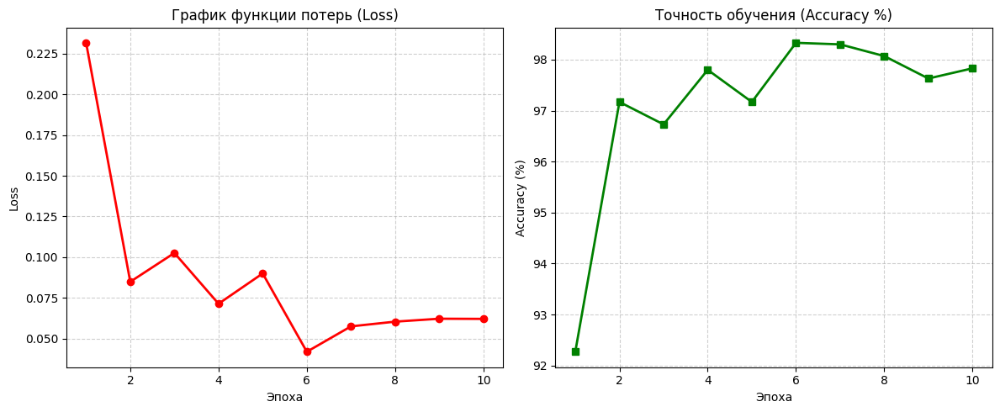

График 'training_plots.png'


In [16]:
import matplotlib.pyplot as plt

losses = [0.2317, 0.0849, 0.1026, 0.0714, 0.0900, 0.0419, 0.0575, 0.0604, 0.0622, 0.0621]
accs = [92.27, 97.17, 96.73, 97.80, 97.17, 98.33, 98.30, 98.07, 97.63, 97.83]

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(range(1, 11), losses, 'r-o', linewidth=2)
plt.title('График функции потерь (Loss)')
plt.xlabel('Эпоха')
plt.ylabel('Loss')
plt.grid(True, linestyle='--', alpha=0.6)

plt.subplot(1, 2, 2)
plt.plot(range(1, 11), accs, 'g-s', linewidth=2)
plt.title('Точность обучения (Accuracy %)')
plt.xlabel('Эпоха')
plt.ylabel('Accuracy (%)')
plt.grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.savefig('training_plots.png', dpi=150)
plt.show()

print("График 'training_plots.png'")